# Importing libraries

In [1]:
import matplotlib.pyplot as plt  # Importing Matplotlib for creating visualizations and plots.
import random  # Importing the 'random' module for generating random numbers and making random selections.
import numpy as np  # Importing NumPy, a library for numerical operations, used here for handling and manipulating image data arrays
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.ndimage import convolve, gaussian_filter
from skimage.transform import resize
from scipy import stats
import os

---

# Reading data

In [2]:
# Load the datasets
train_images = np.load('data/train_images.npy')
train_labels = np.load('data/train_labels.npy')
val_images = np.load('data/val_images.npy')
val_labels = np.load('data/val_labels.npy')
test_images = np.load('data/test_images.npy')
test_labels = np.load('data/test_labels.npy')

# Print basic information about each dataset
print(f"Training images: {train_images.shape}, Training labels: {train_labels.shape}")
print(f"Validation images: {val_images.shape}, Validation labels: {val_labels.shape}")
print(f"Testing images: {test_images.shape}, Testing labels: {test_labels.shape}")


Training images: (9711, 512, 512, 3), Training labels: (9711,)
Validation images: (3237, 512, 512, 3), Validation labels: (3237,)
Testing images: (3237, 512, 512, 3), Testing labels: (3237,)


- The training dataset consists of 9,711 samples of 512x512 RGB images, while the validation and testing sets each contain 3,237 samples.

---

In [3]:
min_num_images_to_display = 5
num_images_to_process = 200

# Define the class names
class_names = ["Blurry", "Corrupt", "Missing_Data", "Noisy", "Priority"]

# Get the unique labels in the training set
unique_labels = np.unique(train_labels)

In [4]:
# import numpy as np

# # Prepare the feature dataframe for selected test images
# test_feature_rows = []

# for image in selected_test_images:
#     grayscale_image = rgb_to_grayscale(image)
#     equalised = histogram_equalization(grayscale_image)  # Apply histogram equalization

#     # Compute Laplacian variance and Row variance
#     laplacian_variance_score = laplacian_variance(equalised)
#     row_variance_score = row_variance(equalised)

#     # Append to feature list
#     test_feature_rows.append({
#         "Laplacian_Variance": laplacian_variance_score,
#         "Row_Variance": row_variance_score
#     })

# # Convert to DataFrame
# test_feature_df = pd.DataFrame(test_feature_rows)

# # Scale the features using the trained scalers
# test_feature_df["Laplacian_Variance"] = laplacian_variance_scaler.transform(test_feature_df[["Laplacian_Variance"]])
# test_feature_df["Row_Variance"] = row_variance_scaler.transform(test_feature_df[["Row_Variance"]])

# # Predict using the ensemble classifier
# ensemble_predictions = ensemble_classifier.predict(test_feature_df)

# # Compare with ground truth labels
# accuracy = np.mean(ensemble_predictions == selected_test_labels)

# print(f"Ensemble Model Accuracy on Selected Test Images: {accuracy * 100:.2f}%")


# Helper Functions

In [5]:
import numpy as np

def detect_uniform_patches(image):
    """Detects solid color (corrupt) or black patches (missing data)."""
    hist, _ = np.histogram(image.ravel(), bins=256, range=(0, 1))
    # print(np.max(hist) / np.sum(hist))
    return np.max(hist) / np.sum(hist)  # Ratio of most common intensity

In [6]:
def laplacian_variance(image):
    """Compute Laplacian variance to measure image sharpness using NumPy."""
    
    # Define the Laplacian kernel (3x3)
    laplacian_kernel = np.array([
        [0,  1,  0],
        [1, -4,  1],
        [0,  1,  0]
    ])

    # Apply the Laplacian filter using convolution
    laplacian_filtered = convolve(image, laplacian_kernel, mode='reflect')

    # Compute variance of the Laplacian response
    variance = laplacian_filtered.var()
    
    return variance


In [7]:
# Function to apply Gaussian filter and compute sharpness feature
def gaussian_blur_feature(image, sigma=1):
    """
    Apply a Gaussian filter and compute the variance of the residual image.
    
    - sigma: Controls the amount of blur.
    - Returns: Variance of the residual (original - blurred)
    """
    blurred = gaussian_filter(image, sigma=sigma)  # Apply Gaussian Blur
    residual = image - blurred  # Compute the Difference
    return np.var(residual)  # Compute variance of residual



In [8]:
# Function to apply Histogram Equalization using NumPy
def histogram_equalization(image):
    """Apply histogram equalization to a grayscale image."""
    image_flattened = image.flatten()  # Flatten image into 1D

    # Compute histogram
    hist, bins = np.histogram(image_flattened, bins=256, range=(0, 1), density=True)

    # Compute the Cumulative Distribution Function (CDF)
    cdf = hist.cumsum()
    cdf_normalized = cdf / cdf.max()  # Normalize to range [0,1]

    # Use linear interpolation to find new pixel values
    equalized_image = np.interp(image_flattened, bins[:-1], cdf_normalized)

    return equalized_image.reshape(image.shape)  # Reshape back to original image size

In [9]:
# Function to convert RGB image to grayscale using NumPy
def rgb_to_grayscale(image):
    """Convert an RGB image to grayscale using NumPy."""
    return np.dot(image[..., :3], [0.2989, 0.5870, 0.1140])  # Luminosity formula

In [10]:
def black_pixel_ratio(image, threshold=0.05):
    black_pixels = np.sum(image <= threshold)  # Count pixels that are ≤ threshold
    total_pixels = image.size  # Total number of pixels in the image

    return black_pixels / total_pixels  # Ratio of black pixels

In [11]:
def row_variance(image):    
    row_variance = np.var(np.mean(image, axis=1))  # Variance along rows

    return row_variance

In [12]:
def column_variance(image):   
    col_variance = np.var(np.mean(image, axis=0))  # Variance along columns

    return col_variance

In [13]:
# Function to normalize Laplacian Variance scores
def normalize_values(values):
    """Normalize a list of values to be between 0 and 1."""
    min_val = np.min(values)
    max_val = np.max(values)
    return (values - min_val) / (max_val - min_val) if max_val > min_val else np.zeros_like(values)

# View Images

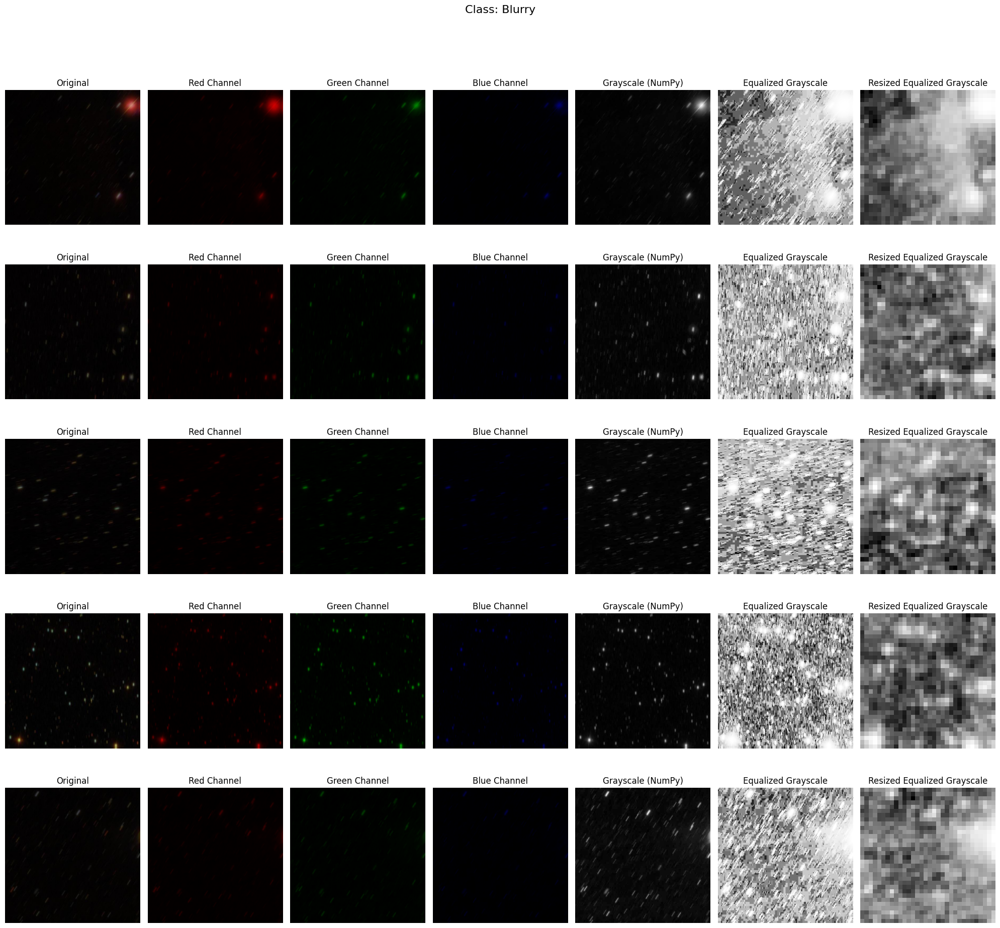

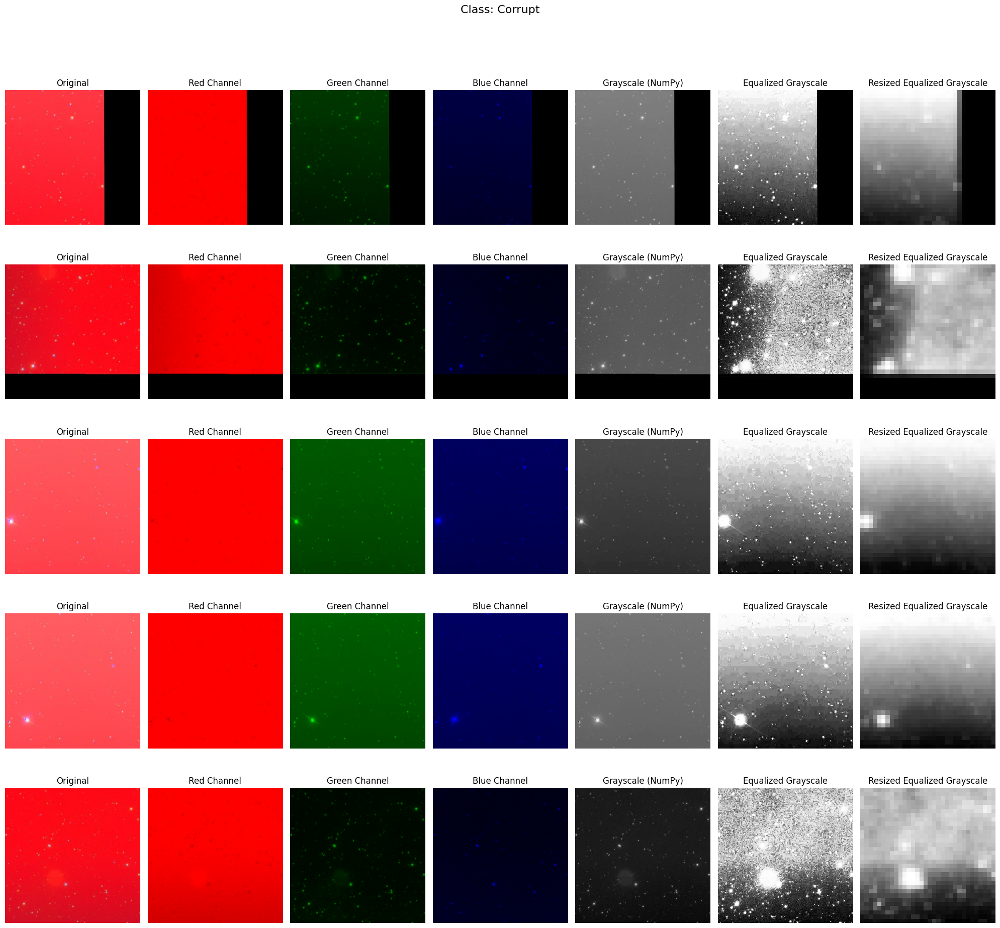

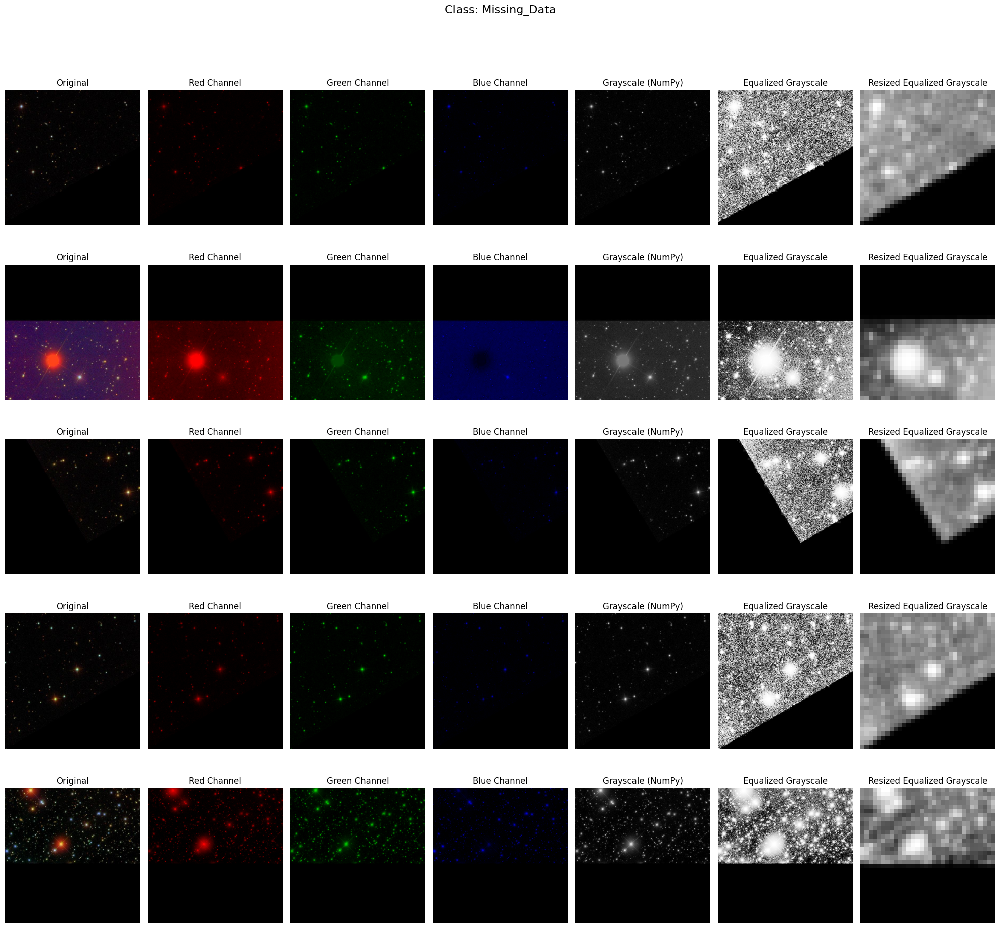

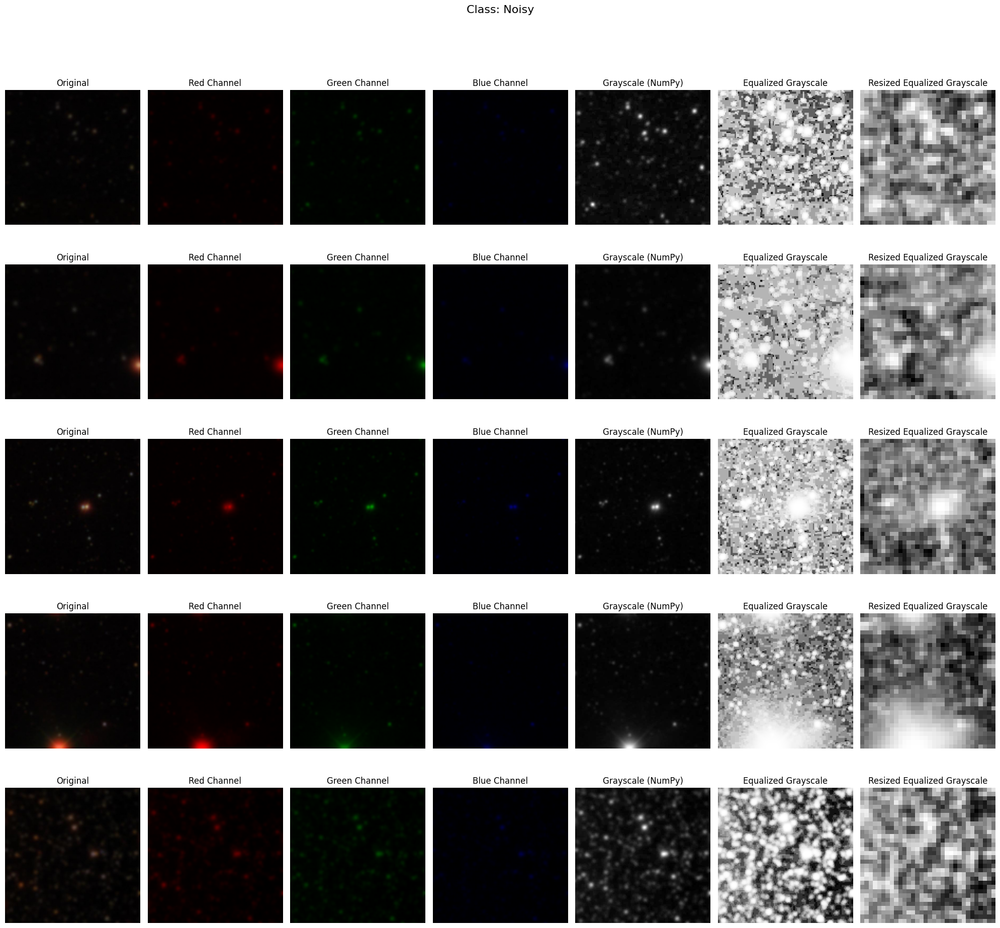

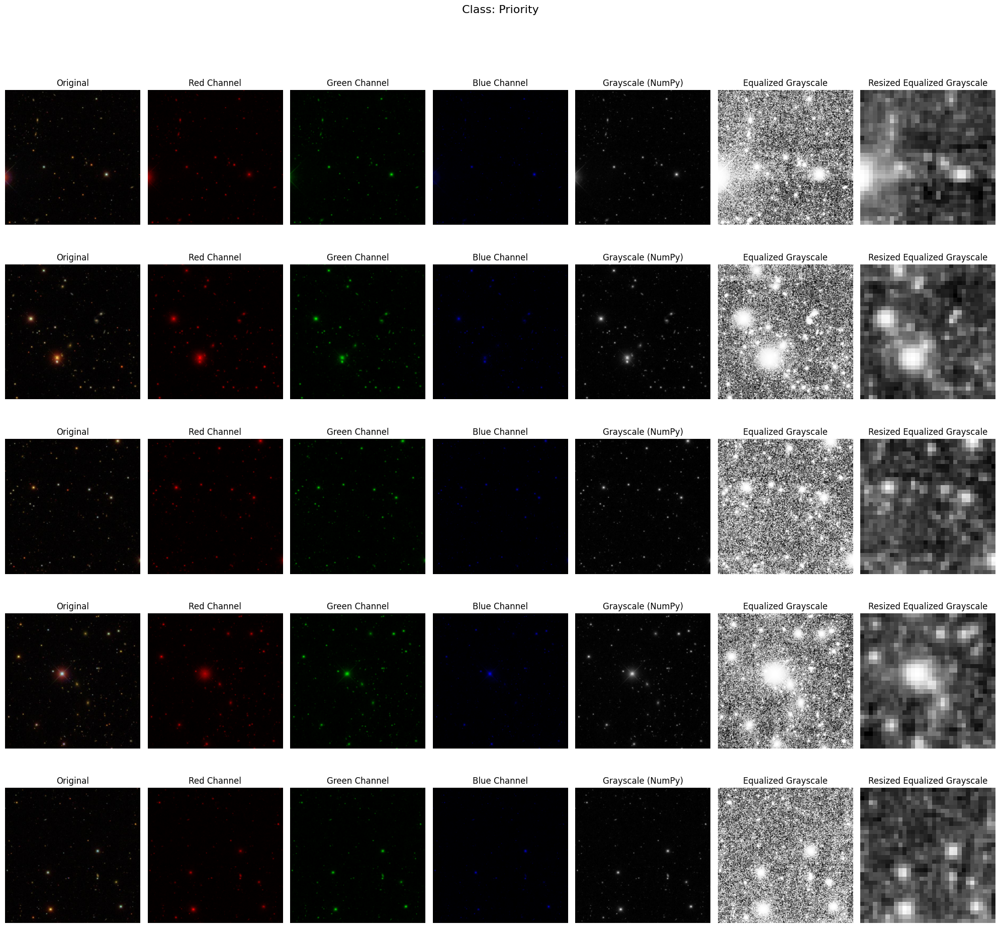

In [14]:
# Define class names
class_names = ["Blurry", "Corrupt", "Missing_Data", "Noisy", "Priority"]

# Get unique labels
unique_labels = np.unique(train_labels)

RESIZED_SHAPE = (32, 32)

# Display images for each class
for label in unique_labels:
    # Find the indices of images belonging to the current class
    class_indices = np.where(train_labels == label)[0]
    
    # Select the first 5 images of this class
    num_images_to_display = min(5, len(class_indices))
    selected_indices = class_indices[:num_images_to_display]
    selected_images = train_images[selected_indices] / 255.0  # Normalize for better visualization

    # Plot the selected images
    fig, axes = plt.subplots(num_images_to_display, 7, figsize=(20, 4 * num_images_to_display)) 
    fig.suptitle(f'Class: {class_names[label]}', fontsize=16)

    
    for i, img in enumerate(selected_images):
        # Extract R, G, B channels
        red_channel = img.copy()
        # red_channel[:, :, 1:] = 0  # Set Green and Blue to 0
        red_channel[:, :, [1,2]] = 0  # Set Green and Blue to 0
        
        green_channel = img.copy()
        green_channel[:, :, [0, 2]] = 0  # Set Red and Blue to 0
        
        blue_channel = img.copy()
        # blue_channel[:, :, :2] = 0  # Set Red and Green to 0
        blue_channel[:, :, [0,1]] = 0  # Set Red and Green to 0

        # Convert to grayscale using NumPy function
        grayscale = rgb_to_grayscale(img)

        # Apply Histogram Equalization
        equalized_image = histogram_equalization(grayscale)

        # Resize the equalized image
        resized_equalized = resize(equalized_image, RESIZED_SHAPE, anti_aliasing=True)
        
        # Plot all variations
        axes[i, 0].imshow(img)
        axes[i, 0].set_title("Original")
        
        axes[i, 1].imshow(red_channel)
        axes[i, 1].set_title("Red Channel")
        
        axes[i, 2].imshow(green_channel)
        axes[i, 2].set_title("Green Channel")
        
        axes[i, 3].imshow(blue_channel)
        axes[i, 3].set_title("Blue Channel")
        
        axes[i, 4].imshow(grayscale, cmap='gray')
        axes[i, 4].set_title("Grayscale (NumPy)")

        axes[i, 5].imshow(equalized_image, cmap='gray')
        axes[i, 5].set_title("Equalized Grayscale")

        axes[i, 6].imshow(resized_equalized, cmap='gray')
        axes[i, 6].set_title("Resized Equalized Grayscale")
        
        # Remove axis
        for j in range(7):
            axes[i, j].axis("off")

    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
    print()

If we were to rank these images in terms of importance based on their significance in capturing and transmitting them back to Earth, the order would be:

1.	`Priority`: Images with the highest importance and usability.
2.	`Noisy` & `Blurry`: Impure images that are potentially recoverable with preprocessing.
3.	`Corrupt` and `Missing Data`: Images with severe issues or missing information, making recovery or reuse least likely.

This ranking will help assess model performance by testing its ability to handle different levels of data quality and recover meaningful information from problematic images.

# EDA

## Feature Proportions To Class

Blurry


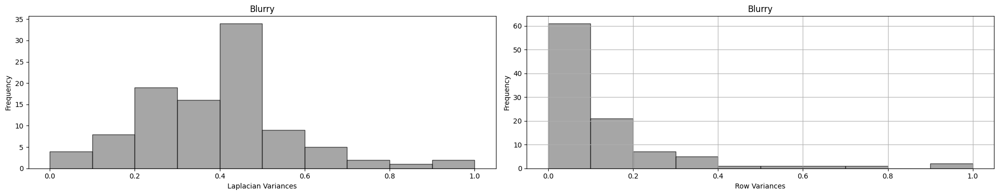


Laplacian Variance for Blurry
Mean:  0.396
Median:  0.413


Row Variance for Blurry
Mean:  0.135
Median:  0.068

Corrupt


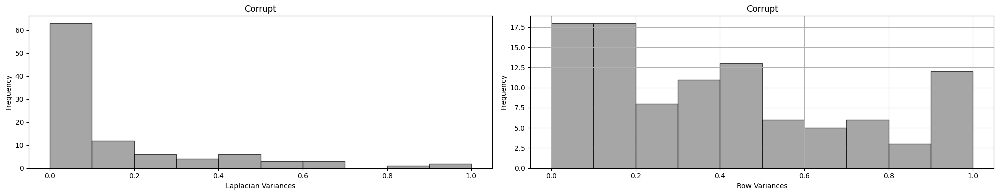


Laplacian Variance for Corrupt
Mean:  0.161
Median:  0.067


Row Variance for Corrupt
Mean:  0.403
Median:  0.371

Missing_Data


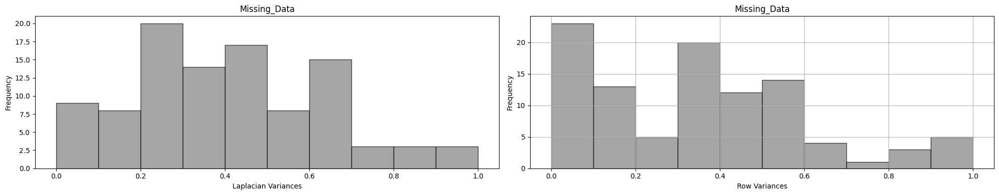


Laplacian Variance for Missing_Data
Mean:  0.415
Median:  0.396


Row Variance for Missing_Data
Mean:  0.347
Median:  0.349

Noisy


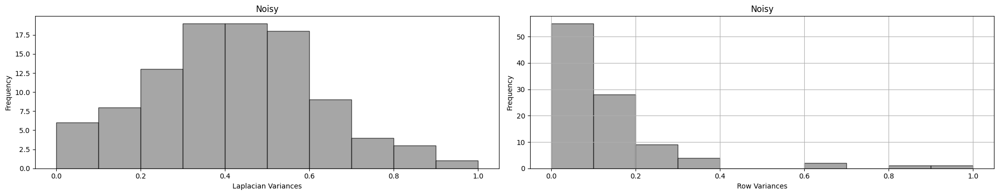


Laplacian Variance for Noisy
Mean:  0.418
Median:  0.429


Row Variance for Noisy
Mean:  0.129
Median:  0.08

Priority


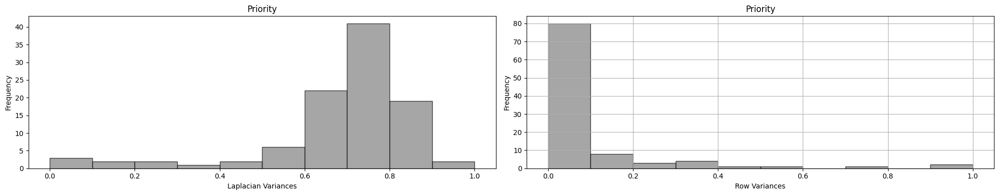


Laplacian Variance for Priority
Mean:  0.68
Median:  0.712


Row Variance for Priority
Mean:  0.098
Median:  0.041



In [15]:
save_dir = 'variance_plots'

row_variance_classes = {
    "Blurry": 0.0,
    "Corrupt": 0.0,
    "Missing_Data": 0.0,
    "Noisy": 0.0,
    "Priority": 0.0,
}

# Display images for each class
for label in unique_labels:
    # Find the indices of images belonging to the current class
    class_indices = np.where(train_labels == label)[0]
    
    # Select the first x images of this class
    num_images_to_display = min(num_images_to_process, len(class_indices))
    selected_indices = class_indices[:num_images_to_display]
    selected_images = train_images[selected_indices] / 255.0  # Normalize for better visualization

    laplacian_variances = []
    row_variances = []
    
    equalised_laplacian_variances = []
    equalised_row_variances = []
    
    
    for i, img in enumerate(selected_images):
        # Convert to grayscale using NumPy function
        grayscale_image = rgb_to_grayscale(img)

        equalised_image = histogram_equalization(grayscale_image)

        laplacian_variance_score = laplacian_variance(equalised_image)
        equalised_laplacian_variances.append(laplacian_variance_score)
        
        row_variance_score = row_variance(equalised_image)
        equalised_row_variances.append(row_variance_score)

        
    
    normalised_laplacian_variances =  normalize_values(np.array(equalised_laplacian_variances))
    normalised_row_variances =  normalize_values(np.array(equalised_row_variances))
    

    # normalised_row_variances = normalised_row_variances[normalised_row_variances >= 0.1]
    # normalised_laplacian_variances = normalised_laplacian_variances[normalised_laplacian_variances >= 0.1]

    
    fig, axes = plt.subplots(1, 2, figsize=(20, 4))

    print(class_names[label])
    

    # sns.kdeplot(normalised_uniform_patches, ax=axes[1], fill=True, color='gray', bw_adjust=0.5)
    axes[0].hist(normalised_laplacian_variances, bins=10, alpha=0.7, color='gray', edgecolor='black')
    axes[0].set_title(f"{class_names[label]}")
    axes[0].set_xlabel("Laplacian Variances")
    axes[0].set_ylabel("Frequency")

    # sns.kdeplot(normalised_uniform_patches, ax=axes[1], fill=True, color='gray', bw_adjust=0.5)
    axes[1].hist(normalised_row_variances, bins=10, alpha=0.7, color='gray', edgecolor='black')
    axes[1].set_title(f"{class_names[label]}")
    axes[1].set_xlabel("Row Variances")
    axes[1].set_ylabel("Frequency")

    
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    #  # **Save the figure as PNG**
    # filename = os.path.join(save_dir, f"{class_names[label]}_variance_plot.png")
    # plt.savefig(filename, dpi=300, bbox_inches='tight')  # High resolution, no extra whitespace
    # print(f"Plot saved as {filename}")
    
    print()
    print(f"Laplacian Variance for {class_names[label]}")
    print("="*50)
    print(f"Mean: ", np.mean(normalised_laplacian_variances).round(3))
    print(f"Median: ", np.median(normalised_laplacian_variances).round(3))
    print()
    
    print()
    print(f"Row Variance for {class_names[label]}")
    print("="*50)
    print(f"Mean: ", np.mean(normalised_row_variances).round(3))
    print(f"Median: ", np.median(normalised_row_variances).round(3))
    print()

    row_variance_classes[class_names[label]] = np.median(normalised_row_variances).round(3)



## Class Balance Check

In [16]:
# Check the balance of the classes in each dataset
train_class_counts = np.bincount(train_labels)
val_class_counts = np.bincount(val_labels)
test_class_counts = np.bincount(test_labels)

# Display the class distribution with class names
print("\nClass distribution:")
print(f"Training set: {dict(zip(class_names, train_class_counts))}")
print(f"Validation set: {dict(zip(class_names, val_class_counts))}")
print(f"Testing set: {dict(zip(class_names, test_class_counts))}")


Class distribution:
Training set: {'Blurry': 2149, 'Corrupt': 635, 'Missing_Data': 1186, 'Noisy': 2140, 'Priority': 3601}
Validation set: {'Blurry': 727, 'Corrupt': 222, 'Missing_Data': 421, 'Noisy': 721, 'Priority': 1146}
Testing set: {'Blurry': 668, 'Corrupt': 213, 'Missing_Data': 414, 'Noisy': 721, 'Priority': 1221}


The `Priority` class has the most data, followed by `Noisy` and `Blurry`, while `Corrupt` has the least, indicating class imbalance.

---

# Creating ML Model Dataset

In [17]:
###### import pandas as pd

import pandas as pd

selected_train_images = []
selected_val_images = []
selected_test_images = []

selected_train_labels = []
selected_val_labels = []
selected_test_labels = []

equalised_train_images = []
equalised_val_images = []
equalised_test_images = []

train_data_rows = []
val_data_rows = []
test_data_rows = []

for label in unique_labels:
    # Find the indices of images belonging to the current class
    train_class_indices = np.where(train_labels == label)[0]
    val_class_indices = np.where(val_labels == label)[0]
    test_class_indices = np.where(test_labels == label)[0]
    
    # Select the first 5 images of this class
    train_num_images_to_display = min(num_images_to_process, len(train_class_indices))
    val_num_images_to_display = min(num_images_to_process, len(val_class_indices))
    test_num_images_to_display = min(num_images_to_process, len(test_class_indices))
    
    selected_train_indices = train_class_indices[:train_num_images_to_display]
    selected_val_indices = train_class_indices[:val_num_images_to_display]
    selected_test_indices = train_class_indices[:test_num_images_to_display]
    
    selected_train_images = train_images[selected_train_indices] / 255.0
    selected_val_images = train_images[selected_val_indices] / 255.0
    selected_test_images = train_images[selected_test_indices] / 255.0

    selected_train_labels.extend(train_labels[selected_train_indices])
    selected_val_labels.extend(val_labels[selected_val_indices])
    selected_test_labels.extend(test_labels[selected_test_indices])

    for image in selected_train_images:
        grayscale_image = rgb_to_grayscale(image)
        equalised = histogram_equalization(grayscale_image)  # Apply histogram equalization
        
        equalised_train_images.append(equalised)
        
        # Compute Laplacian variance
        variance = laplacian_variance(equalised)

        row_variance_score = row_variance(equalised)

        row_variance_class = row_variance_classes[class_names[label]]

        # Append to DataFrame
        train_data_rows.append({
            'Laplacian_Variance': variance,
            'Row_Variance': row_variance_score,
            'Row_Variance_Class': row_variance_class,
            'Label': label
        })


    print(f"{class_names[label]} Train Images Equalised")

    for image in selected_val_images:
        grayscale_image = rgb_to_grayscale(image)
        equalised = histogram_equalization(grayscale_image)  # Apply histogram equalization
        
        equalised_train_images.append(equalised)
        
        # Compute Laplacian variance
        variance = laplacian_variance(equalised)

        row_variance_score = row_variance(equalised)

        row_variance_class = row_variance_classes[class_names[label]]

        # Append to DataFrame
        val_data_rows.append({
            'Laplacian_Variance': variance,
            'Row_Variance': row_variance_score,
            'Row_Variance_Class': row_variance_class,
            'Label': label
        })


    print(f"{class_names[label]} Val Images Equalised")

    for image in selected_test_images:
        grayscale_image = rgb_to_grayscale(image)
        equalised = histogram_equalization(grayscale_image)  # Apply histogram equalization
        
        equalised_train_images.append(equalised)
        
        # Compute Laplacian variance
        variance = laplacian_variance(equalised)

        row_variance_score = row_variance(equalised)

        row_variance_class = row_variance_classes[class_names[label]]

        # Append to DataFrame
        test_data_rows.append({
            'Laplacian_Variance': variance,
            'Row_Variance': row_variance_score,
            'Row_Variance_Class': row_variance_class,
            'Label': label
        })

    print(f"{class_names[label]} Test Images Equalised")


train_data_df = pd.DataFrame(train_data_rows)
val_data_df = pd.DataFrame(val_data_rows)
test_data_df = pd.DataFrame(test_data_rows)

def corrupt_missing_mapping(label):
    if label in [0, 3]:
        return 0
    elif label in [1, 2]:
        return 1
    # else:
    #     return 2
        
# Shuffle the DataFrame
train_data_df = train_data_df.sample(frac=1, random_state=42).reset_index(drop=True)
train_data_df['Priority'] = train_data_df['Label'].map(lambda x: 1 if x == 4 else 0)
train_data_df['Corrupt_Missing'] = train_data_df['Label'].apply(corrupt_missing_mapping)

val_data_df = val_data_df.sample(frac=1, random_state=42).reset_index(drop=True)
val_data_df['Priority'] = val_data_df['Label'].map(lambda x: 1 if x == 4 else 0)
val_data_df['Corrupt_Missing'] = val_data_df['Label'].apply(corrupt_missing_mapping)

test_data_df = test_data_df.sample(frac=1, random_state=42).reset_index(drop=True)
test_data_df['Priority'] = test_data_df['Label'].map(lambda x: 1 if x == 4 else 0)
test_data_df['Corrupt_Missing'] = test_data_df['Label'].apply(corrupt_missing_mapping)

Blurry Train Images Equalised
Blurry Val Images Equalised
Blurry Test Images Equalised
Corrupt Train Images Equalised
Corrupt Val Images Equalised
Corrupt Test Images Equalised
Missing_Data Train Images Equalised
Missing_Data Val Images Equalised
Missing_Data Test Images Equalised
Noisy Train Images Equalised
Noisy Val Images Equalised
Noisy Test Images Equalised
Priority Train Images Equalised
Priority Val Images Equalised
Priority Test Images Equalised


In [18]:
# import matplotlib.pyplot as plt
# import seaborn as sns

# # Plot histogram of Laplacian Variance with Priority as hue
# plt.figure(figsize=(10, 6))
# sns.histplot(data=train_data_df, x="Laplacian_Variance", hue="Priority", kde=True, bins=30, alpha=0.6)

# # Labels and title
# plt.xlabel("Laplacian Variance")
# plt.ylabel("Frequency")
# plt.title("Histogram of Laplacian Variance with Priority as Hue")

# plt.show()

# import seaborn as sns
# import matplotlib.pyplot as plt

# # Create scatter plot
# plt.figure(figsize=(8, 6))
# sns.scatterplot(
#     data=train_data_df, 
#     x='Laplacian_Variance', 
#     y='Row_Variance', 
#     hue='Corrupt_Missing', 
#     palette='viridis',  # Adjust color mapping
#     alpha=0.7  # Transparency for better visibility
# )

# # Labels and title
# plt.xlabel("Laplacian Variance (Sharpness)")
# plt.ylabel("Row Variance (Texture)")
# plt.title("Scatter Plot of Laplacian Variance vs. Row Variance")

# # Show legend and grid
# plt.legend(title="Class 3 Category")
# plt.grid(True)

# # Display plot
# plt.show()

# Handling Class Imbalance

In [19]:
from sklearn.utils import resample

# Downsampling
train_majority_class = train_data_df[train_data_df['Priority'] == 0]
train_minority_class = train_data_df[train_data_df['Priority'] == 1]

train_majority_downsampled = resample(train_majority_class, 
                                replace=False,  # Sample without replacement
                                n_samples=len(train_minority_class),  # Match minority class size
                                random_state=42)

train_balanced_df = pd.concat([train_majority_downsampled, train_minority_class])
train_balanced_df = train_balanced_df.sample(frac=1, random_state=42).reset_index(drop=True)



val_majority_class = val_data_df[test_data_df['Priority'] == 0]
val_minority_class = val_data_df[test_data_df['Priority'] == 1]

val_majority_downsampled = resample(val_majority_class, 
                                replace=False,  # Sample without replacement
                                n_samples=len(val_minority_class),  # Match minority class size
                                random_state=42)

val_balanced_df = pd.concat([val_majority_downsampled, val_minority_class])
val_balanced_df = val_balanced_df.sample(frac=1, random_state=42).reset_index(drop=True)





test_majority_class = test_data_df[test_data_df['Priority'] == 0]
test_minority_class = test_data_df[test_data_df['Priority'] == 1]

test_majority_downsampled = resample(test_majority_class, 
                                replace=False,  # Sample without replacement
                                n_samples=len(test_minority_class),  # Match minority class size
                                random_state=42)

test_balanced_df = pd.concat([test_majority_downsampled, test_minority_class])
test_balanced_df = test_balanced_df.sample(frac=1, random_state=42).reset_index(drop=True)

In [20]:
train_data_df_2 = train_balanced_df.copy()
train_data_df_2 = train_data_df_2[train_balanced_df["Priority"] != 1]
train_data_df_2['Corrupt_Missing'] = train_data_df_2['Label'].apply(corrupt_missing_mapping)
train_data_df_2 = train_data_df_2.drop(columns=["Priority"])

val_data_df_2 = val_balanced_df.copy()
val_data_df_2 = val_data_df_2[val_data_df_2["Priority"] != 1]
val_data_df_2['Corrupt_Missing'] = val_data_df_2['Label'].apply(corrupt_missing_mapping)
val_data_df_2 = val_data_df_2.drop(columns=["Priority"])

test_data_df_2 = test_balanced_df.copy()
test_data_df_2 = test_data_df_2[test_data_df_2["Priority"] != 1]
test_data_df_2['Corrupt_Missing'] = test_data_df_2['Label'].apply(corrupt_missing_mapping)
test_data_df_2 = test_data_df_2.drop(columns=["Priority"])

In [21]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Create scatter plot
# plt.figure(figsize=(8, 6))
# sns.scatterplot(
#     data=train_balanced_df, 
#     x='Laplacian_Variance', 
#     y='Row_Variance', 
#     hue='Corrupt_Missing', 
#     palette='viridis',  # Adjust color mapping
#     alpha=0.7  # Transparency for better visibility
# )

# # Labels and title
# plt.xlabel("Laplacian Variance (Sharpness)")
# plt.ylabel("Row Variance (Texture)")
# plt.title("Scatter Plot of Laplacian Variance vs. Row Variance")

# # Show legend and grid
# plt.legend(title="Class 3 Category")
# plt.grid(True)

# # Display plot
# plt.show()

# Laplacian Variance ML Model

## Building

In [22]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
import joblib

# Selecting features and target
features = ["Laplacian_Variance"]  # Feature column
target = "Priority"  # Target column

# Splitting into X (features) and y (target)
X_train = train_balanced_df[features]
y_train = train_balanced_df[target]

X_val = val_balanced_df[features]
y_val = val_balanced_df[target]

X_test = test_balanced_df[features]
y_test = test_balanced_df[target]

# Standardizing the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Initialize and train the logistic regression model
model = LogisticRegression()
model.fit(X_train_scaled, y_train)

# Save the model
joblib.dump(model, "laplacian_variance_logistic_regression_model.pkl")

# Save the scaler (since we need to normalize new inputs in the future)
joblib.dump(scaler, "laplacian_variance_scaler.pkl")

['laplacian_variance_scaler.pkl']

## Evaluating


=== Test Set Classification Report ===
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       100
           1       0.98      0.97      0.97       100

    accuracy                           0.97       200
   macro avg       0.98      0.97      0.97       200
weighted avg       0.98      0.97      0.97       200


=== Accuracy Scores ===
Test Accuracy: 0.9750


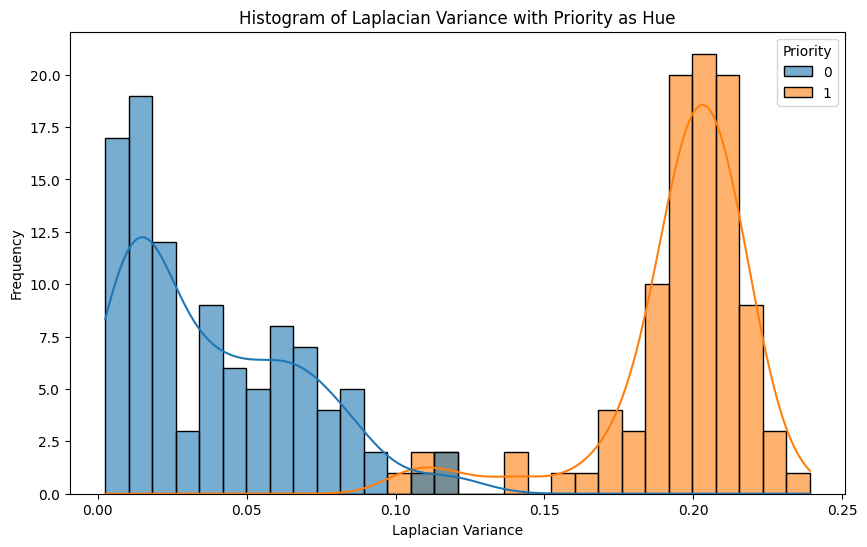

In [23]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Predictions
y_test_pred = model.predict(X_test_scaled)

# Evaluate the model
test_accuracy = accuracy_score(y_test, y_test_pred)
test_report = classification_report(y_test, y_test_pred)

# cnf_matrix = confusion_matrix(y_test, y_test_pred)

print("\n=== Test Set Classification Report ===")
print(test_report)

# Display accuracy scores
print("\n=== Accuracy Scores ===")
print(f"Test Accuracy: {test_accuracy:.4f}")


# Plot histogram of Laplacian Variance with Priority as hue
plt.figure(figsize=(10, 6))
sns.histplot(data=train_balanced_df, x="Laplacian_Variance", hue="Priority", kde=True, bins=30, alpha=0.6)

# Labels and title
plt.xlabel("Laplacian Variance")
plt.ylabel("Frequency")
plt.title("Histogram of Laplacian Variance with Priority as Hue")

plt.show()



# class_names=[0,1] # name  of classes
# fig, ax = plt.subplots()
# tick_marks = np.arange(len(class_names))
# plt.xticks(tick_marks, class_names)
# plt.yticks(tick_marks, class_names)

# # create heatmap
# sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
# ax.xaxis.set_label_position("top")
# plt.tight_layout()
# plt.title('Confusion matrix', y=1.1)
# plt.ylabel('Actual label')
# plt.xlabel('Predicted label')

# Row Variance ML Model

## Building

In [24]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
import joblib

# Selecting features and target
features = ["Row_Variance"]  # Feature column
target = "Corrupt_Missing"  # Target column

# Splitting into X (features) and y (target)
X_train = train_data_df_2[features]
y_train = train_data_df_2[target]

X_val = val_data_df_2[features]
y_val = val_data_df_2[target]

X_test = test_data_df_2[features]
y_test = test_data_df_2[target]

# Standardizing the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Initialize and train the logistic regression model
model = LogisticRegression()
model.fit(X_train_scaled, y_train)

# Save the model
joblib.dump(model, "row_variance_logistic_regression_model.pkl")

# Save the scaler (since we need to normalize new inputs in the future)
joblib.dump(scaler, "row_variance_scaler.pkl")

['row_variance_scaler.pkl']

## Evaluating


=== Test Set Classification Report ===
              precision    recall  f1-score   support

           0       0.67      0.86      0.75        51
           1       0.79      0.55      0.65        49

    accuracy                           0.71       100
   macro avg       0.73      0.71      0.70       100
weighted avg       0.73      0.71      0.70       100


=== Accuracy Scores ===
Test Accuracy: 0.7100


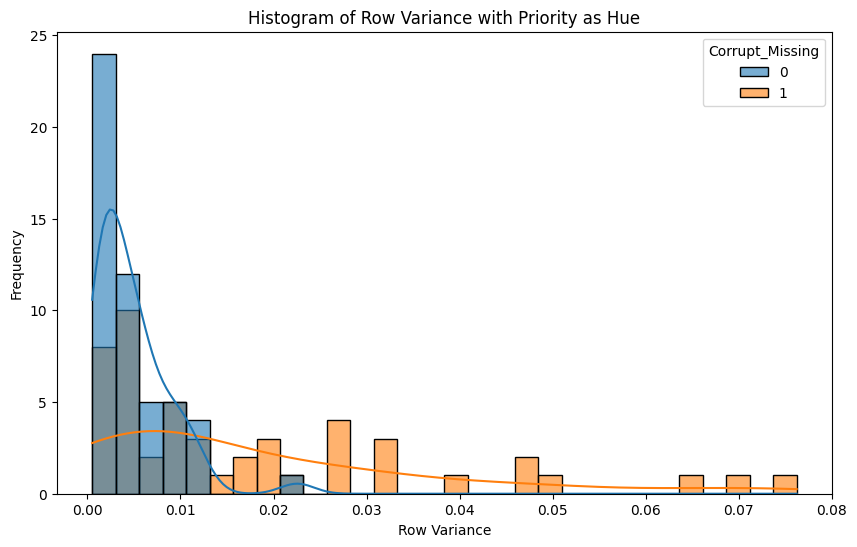

In [25]:


# Predictions
y_test_pred = model.predict(X_test_scaled)

# Evaluate the model
test_accuracy = accuracy_score(y_test, y_test_pred)
test_report = classification_report(y_test, y_test_pred)

# cnf_matrix = confusion_matrix(y_test, y_test_pred)

print("\n=== Test Set Classification Report ===")
print(test_report)

# Display accuracy scores
print("\n=== Accuracy Scores ===")
print(f"Test Accuracy: {test_accuracy:.4f}")


# Plot histogram of Row Variance with as Corrupt_Missing hue
plt.figure(figsize=(10, 6))
sns.histplot(data=train_data_df_2, x="Row_Variance", hue="Corrupt_Missing", kde=True, bins=30, alpha=0.6)

# Labels and title
plt.xlabel("Row Variance")
plt.ylabel("Frequency")
plt.title("Histogram of Row Variance with Priority as Hue")

plt.show()

# # Compute proportions
# proportions = train_data_df_2.groupby(['Corrupt_Missing', 'Row_Variance_Class']).size().unstack()
# proportions = proportions.div(proportions.sum(axis=1), axis=0)  # Normalize per target
# display(proportions)
# # Plot
# proportions.plot(kind='bar', stacked=True, figsize=(8,6))
# plt.ylabel("Proportion")
# plt.title("Proportion of Row_Variance_Class per Corrupt_Missing")
# plt.legend(title="Row_Variance_Class")
# plt.show()


# Ensemble Model

## Building

In [27]:
# # from sklearn.ensemble import VotingClassifier
# # import joblib
# # import pandas as pd

# # # Load models and scalers
# # laplacian_variance_model = joblib.load("laplacian_variance_logistic_regression_model.pkl")
# # laplacian_variance_scaler = joblib.load("laplacian_variance_scaler.pkl")

# # row_variance_model = joblib.load("row_variance_logistic_regression_model.pkl")
# # row_variance_scaler = joblib.load("row_variance_scaler.pkl")

# # # Create an ensemble model
# # ensemble_classifier = VotingClassifier(
# #     estimators=[
# #         ("laplacian", laplacian_variance_model),
# #         ("row_variance", row_variance_model)
# #     ],
# #     voting="hard"  # Majority voting
# # )

# from sklearn.ensemble import VotingClassifier
# import joblib
# import pandas as pd

# # Load models and scalers
# laplacian_variance_model = joblib.load("laplacian_variance_logistic_regression_model.pkl")
# row_variance_model = joblib.load("row_variance_logistic_regression_model.pkl")

# laplacian_variance_scaler = joblib.load("laplacian_variance_scaler.pkl")
# row_variance_scaler = joblib.load("row_variance_scaler.pkl")

# # Create the ensemble classifier
# ensemble_classifier = VotingClassifier(
#     estimators=[
#         ("laplacian", laplacian_variance_model),
#         ("row_variance", row_variance_model)
#     ],
#     voting="hard"
# )

# # Train the ensemble model using the same training data used for individual models
# X_train = train_data_df[["Laplacian_Variance", "Row_Variance"]]
# y_train = train_data_df["Label"]  # Ensure the correct target column is used

# # Scale training data
# X_train_scaled = X_train.copy()
# X_train_scaled["Laplacian_Variance"] = laplacian_variance_scaler.transform(X_train[["Laplacian_Variance"]])
# X_train_scaled["Row_Variance"] = row_variance_scaler.transform(X_train[["Row_Variance"]])

# # Fit the ensemble classifier
# ensemble_classifier.fit(X_train_scaled, y_train)

# # Now, you can apply the ensemble classifier on the test dataset

# # Prepare the feature DataFrame for selected test images
# test_feature_rows = []

# for image in selected_test_images:
#     grayscale_image = rgb_to_grayscale(image)
#     equalised = histogram_equalization(grayscale_image)  # Apply histogram equalization

#     # Compute Laplacian variance and Row variance
#     laplacian_variance_score = laplacian_variance(equalised)
#     row_variance_score = row_variance(equalised)

#     # Append to feature list
#     test_feature_rows.append({
#         "Laplacian_Variance": laplacian_variance_score,
#         "Row_Variance": row_variance_score
#     })

# # Convert to DataFrame
# test_feature_df = pd.DataFrame(test_feature_rows)

# # Scale the features using the trained scalers
# test_feature_df["Laplacian_Variance"] = laplacian_variance_scaler.transform(test_feature_df[["Laplacian_Variance"]])
# test_feature_df["Row_Variance"] = row_variance_scaler.transform(test_feature_df[["Row_Variance"]])

# # Predict using the trained ensemble classifier
# ensemble_predictions = ensemble_classifier.predict(test_feature_df)

# # Compare with ground truth labels
# accuracy = np.mean(ensemble_predictions == selected_test_labels)

# print(f"Ensemble Model Accuracy on Selected Test Images: {accuracy * 100:.2f}%")


## Evaluating

In [ ]:
# Commented out since it does not work


# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# from sklearn.metrics import classification_report, confusion_matrix

# # Function to map original labels (0-4) to the 3-class system
# def map_labels(label):
#     """
#     Maps the original labels (0-4) to the three categories used in the ensemble model:
#     - 4 -> Priority (0)
#     - 0, 3 -> Noisy_Blurry (1)
#     - 1, 2 -> Corrupt_Missing (2)
#     """
#     if label == 4:
#         return 0  # Priority
#     elif label in [0, 3]:
#         return 1  # Noisy_Blurry
#     elif label in [1, 2]:
#         return 2  # Corrupt_Missing

# # Initialize lists to store predictions and actual mapped labels
# ensemble_predictions = []
# actual_labels = []

# # Loop through the test images and make predictions
# for image, label in zip(selected_test_images, selected_test_labels):
#     # Get the ensemble model's prediction
#     predicted_class = ensemble_model(image)  # Ensure this function returns a class label (0, 1, or 2)

#     # Store the prediction and mapped actual label
#     ensemble_predictions.append(predicted_class)
#     actual_labels.append(map_labels(label))  # Apply mapping to actual labels

# # Convert to NumPy arrays for evaluation
# ensemble_predictions = np.array(ensemble_predictions)
# actual_labels = np.array(actual_labels)

# # Generate classification report
# print("\n=== Classification Report ===")
# print(classification_report(actual_labels, ensemble_predictions, target_names=["Priority", "Noisy_Blurry", "Corrupt_Missing"]))

# # Generate confusion matrix
# conf_matrix = confusion_matrix(actual_labels, ensemble_predictions)

# # Plot confusion matrix
# plt.figure(figsize=(6, 6))
# sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues",
#             xticklabels=["Priority", "Noisy_Blurry", "Corrupt_Missing"], 
#             yticklabels=["Priority", "Noisy_Blurry", "Corrupt_Missing"])
# plt.xlabel("Predicted Label")
# plt.ylabel("Actual Label")
# plt.title("Confusion Matrix for Ensemble Model")
# plt.show()


In [ ]:
# import numpy as np

# # Prepare the feature dataframe for selected test images
# test_feature_rows = []

# for image in selected_test_images:
#     grayscale_image = rgb_to_grayscale(image)
#     equalised = histogram_equalization(grayscale_image)  # Apply histogram equalization

#     # Compute Laplacian variance and Row variance
#     laplacian_variance_score = laplacian_variance(equalised)
#     row_variance_score = row_variance(equalised)

#     # Append to feature list
#     test_feature_rows.append({
#         "Laplacian_Variance": laplacian_variance_score,
#         "Row_Variance": row_variance_score
#     })

# # Convert to DataFrame
# test_feature_df = pd.DataFrame(test_feature_rows)

# # Scale the features using the trained scalers
# test_feature_df["Laplacian_Variance"] = laplacian_variance_scaler.transform(test_feature_df[["Laplacian_Variance"]])
# test_feature_df["Row_Variance"] = row_variance_scaler.transform(test_feature_df[["Row_Variance"]])

# # Predict using the ensemble classifier
# ensemble_predictions = ensemble_classifier.predict(test_feature_df)

# # Compare with ground truth labels
# accuracy = np.mean(ensemble_predictions == selected_test_labels)

# print(f"Ensemble Model Accuracy on Selected Test Images: {accuracy * 100:.2f}%")


# Removing data from memory

**⚠️ Important Notice**: In this shared environment (ilifu), efficient memory usage is crucial. Freeing unused data helps prevent memory bottlenecks, ensuring smooth performance for both your work and other users, especially when working with large datasets.

**Make sure to follow this same practice when you develop your own pipeline during the hackathon to optimize performance and resource allocation.**

In [ ]:
import gc

# Remove the data from memory
del train_images, train_labels, val_images, val_labels, test_images, test_labels

# Force garbage collection to free up memory
gc.collect()

# Clear the input/output cache
print("Data removed from memory.")

---